In [3]:
import os
from PIL import Image, ImageFile
import numpy as np


ImageFile.LOAD_TRUNCATED_IMAGES = True


main_folder_path = 'plaice_right_png'


target_size = (224, 224)


image_data = []
labels = []


for class_name in os.listdir(main_folder_path):
    class_folder_path = os.path.join(main_folder_path, class_name)
    
    if os.path.isdir(class_folder_path):  
        for image_name in os.listdir(class_folder_path):
            image_path = os.path.join(class_folder_path, image_name)
            
            try:
                
                with Image.open(image_path) as img:
                    
                    img = img.resize(target_size).convert('RGB')
                    
                    
                    img_array = np.array(img) / 255.0
                    
                    
                    image_data.append(img_array)
                    labels.append(class_name)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")


image_data = np.array(image_data)
labels = np.array(labels)


In [20]:
np.unique(labels)

array(['0', '1', '10', '11', '12', '13', '14', '2', '3', '4', '5', '6',
       '7', '8', '9'], dtype='<U2')

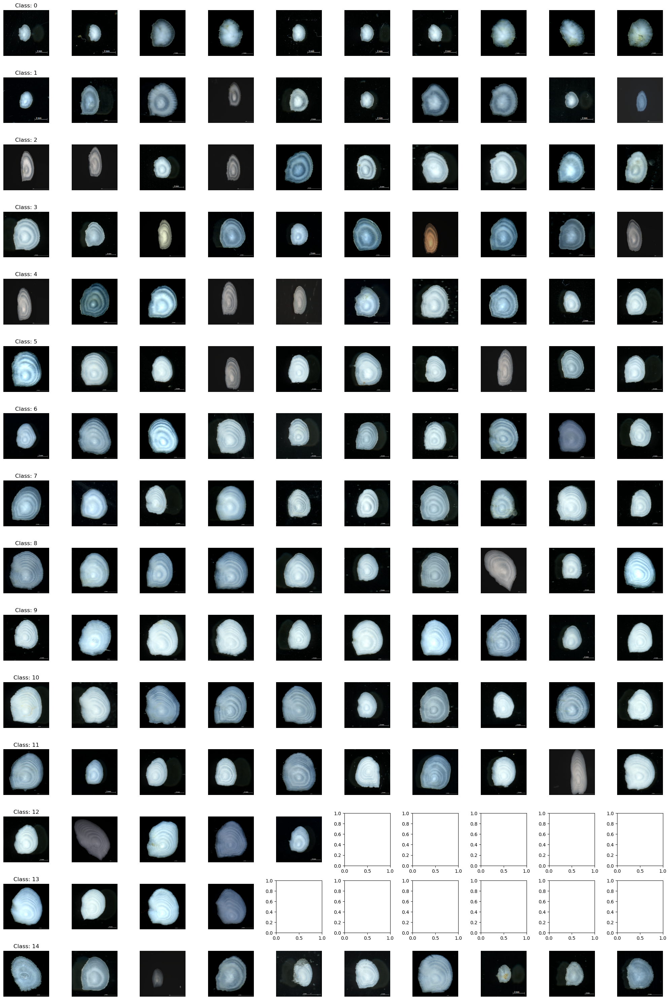

In [28]:
import matplotlib.pyplot as plt
import numpy as np

def display_images_numerically(image_data, labels, num_classes=3, num_images=5):
   
    unique_labels = np.unique(labels)
    sorted_indices = np.argsort([int(label) for label in unique_labels])
    sorted_labels = unique_labels[sorted_indices]
    
    fig, axs = plt.subplots(num_classes, num_images, figsize=(num_images*2, num_classes*2))
    
    for i, label in enumerate(sorted_labels[:num_classes]):
        class_images = image_data[labels == label]
        for j in range(min(num_images, len(class_images))):
            ax = axs[i, j] if num_classes > 1 else axs[j]
            ax.imshow(class_images[j])
            ax.axis('off')
            if j == 0:
                ax.set_title(f"Class: {label}")
    plt.tight_layout()
    plt.show()

display_images_numerically(image_data, labels, num_classes=15, num_images=10)



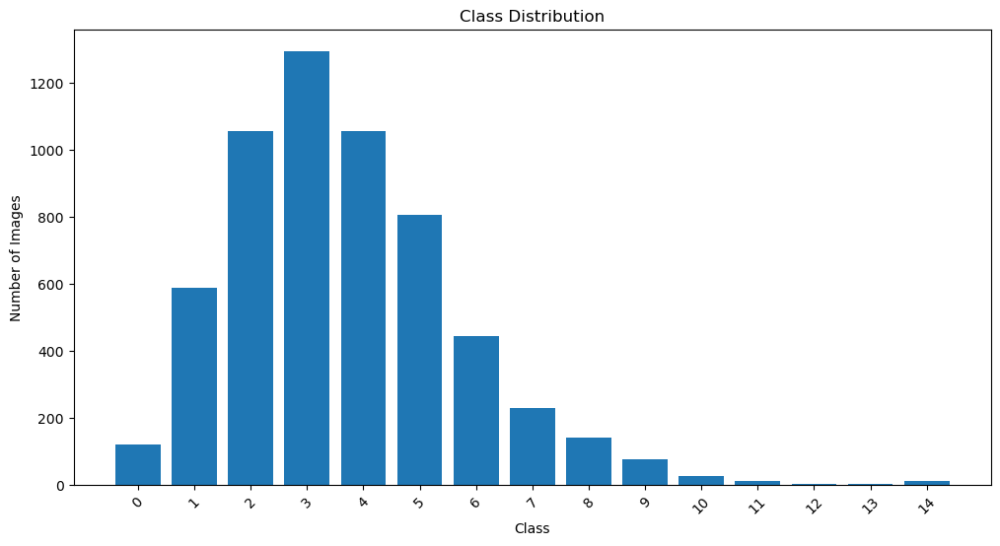

In [14]:
#Destribution of dataset before equilibration
def plot_class_distribution_numerically(labels):

    unique, counts = np.unique(labels, return_counts=True)
    # Sort the classes numerically and their counts accordingly
    sorted_indices = np.argsort([int(label) for label in unique])
    sorted_labels = unique[sorted_indices]
    sorted_counts = counts[sorted_indices]
    
    plt.figure(figsize=(12, 6))
    plt.bar(sorted_labels, sorted_counts)
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.title('Class Distribution')
    plt.xticks(rotation=45)
    plt.show()

plot_class_distribution_numerically(labels)


In [23]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np


target_count_per_class = max(np.unique(labels, return_counts=True)[1])


datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

augmented_image_data = []
augmented_labels = []


for label in np.unique(labels):
    
    class_images = image_data[labels == label]
    
    
    num_to_augment = target_count_per_class - class_images.shape[0]
    
    
    if num_to_augment > 0:
        
        temp_augmented_images = []
        
        it = datagen.flow(class_images, batch_size=1)
        for _ in range(num_to_augment):
    
               temp_augmented_images.append(next(it)[0])
            
        
        augmented_image_data.extend(class_images)
        augmented_image_data.extend(temp_augmented_images)
       
        augmented_labels.extend([label] * (class_images.shape[0] + num_to_augment))
    else:
        
        augmented_image_data.extend(class_images)
        augmented_labels.extend([label] * class_images.shape[0])


augmented_image_data = np.array(augmented_image_data)
augmented_labels = np.array(augmented_labels)


indices = np.arange(augmented_image_data.shape[0])
np.random.shuffle(indices)
augmented_image_data = augmented_image_data[indices]
augmented_labels = augmented_labels[indices]


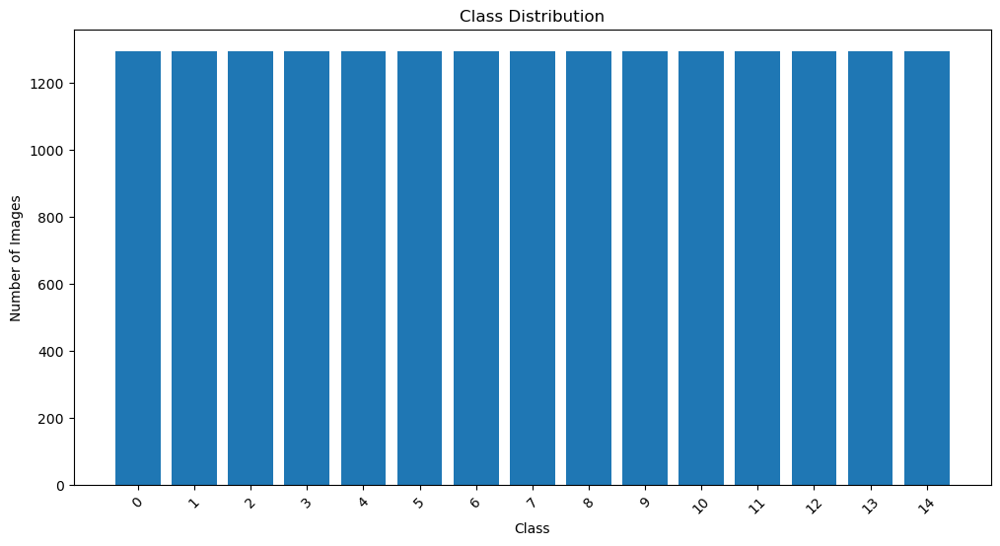

In [24]:
plot_class_distribution_numerically(augmented_labels)

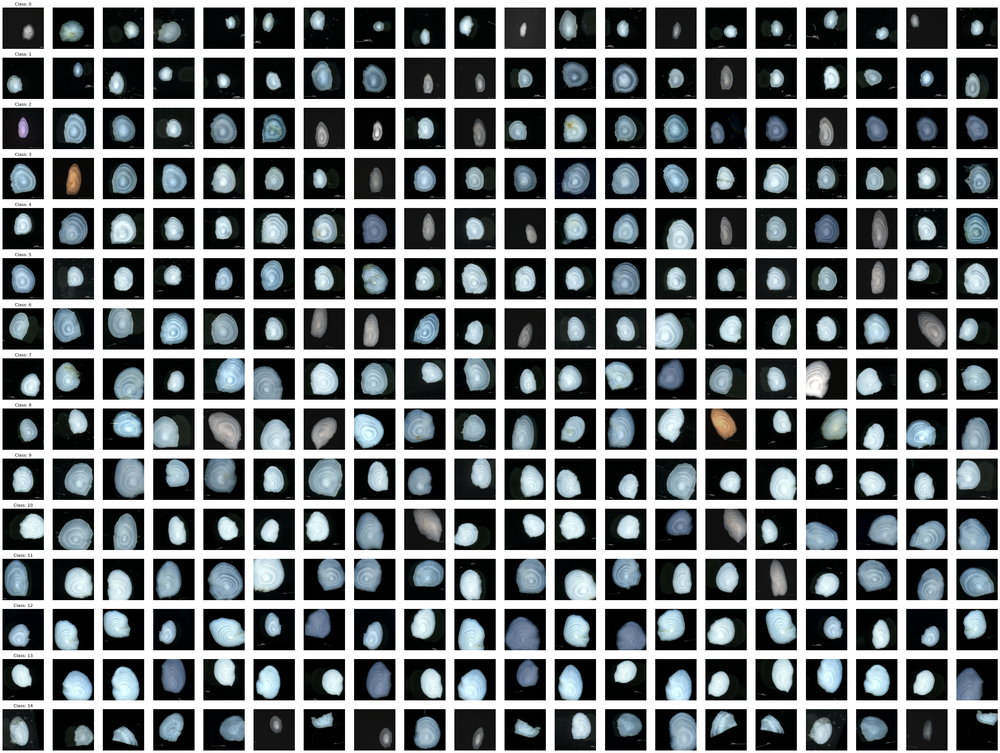

In [27]:
display_images_numerically(augmented_image_data, augmented_labels, num_classes=15, num_images=20)